In [88]:
%matplotlib inline
import numpy as np
from matplotlib import pyplot
from matplotlib import rcParams

In [95]:
dx = 0.01
dt = 0.01
w = 10
Lx = 2
Lt = 8
Nx = int(Lx / dx)
Nt = int(Lt / dt)
U = np.zeros([Nt, Nx])
a = np.zeros(Nx)
a[:int(Nx / 2)] = 0.5 # a = 0.5, 0 <= x < Lx / 2
a[int(Nx / 2):] = 0.6 # a = 0.6, Lx / 2 <= x < Lx
#U[:, -1] = 0 # already zeroes
U[:int(Nt / 2), 0] = np.array([np.sin(w * t * dt) for t in range(int(Nt / 2))])
# ^^^ filling U array as U(0, t) = sin(wt)

In [96]:
# main calculation cycle
# U[n + 1, i] = 2U[n, i] - U[n - 1, i] + (a * dt / dx)^2 * (U[n, i + 1] - 2U[n, i] + U[n, i - 1])
for n in range(1, Nt - 1):
    U[n + 1, 1:-1] = 2. * U[n, 1:-1] - U[n - 1, 1:-1] + (a[1:-1] * dt / dx)**2 * (U[n, 2:] - 2 * U[n, 1:-1] + U[n, :-2])    

In [97]:
from matplotlib import animation
from IPython.display import HTML

In [98]:
def animate(data):
    x = np.linspace(0, 2, Nx)
    y = data
    line.set_data(x, y)
    return line

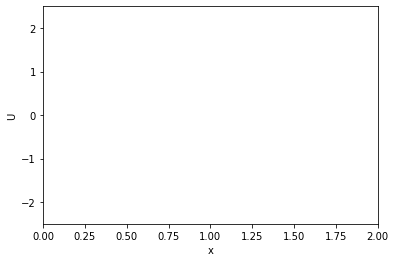

In [99]:
fig = pyplot.figure();
ax = pyplot.axes(xlim = (0, 2),
                 ylim = (-2.5, 2.5),
                 xlabel = ('x'),
                 ylabel = ('U'));
line, = ax.plot([], [], '-', color = '#003366', lw = 2);

In [100]:
anim = animation.FuncAnimation(fig, animate, frames = U, interval = 50)
HTML(anim.to_jshtml())